# 06 · Dynamic Station Clustering

## Objective
The goal of this notebook is to segment the New York City bike-share stations into distinct groups based on their temporal usage patterns. By identifying these patterns, it is possible to characterize the functional role of different urban areas.
1.  Temporal Pattern Identification: Identify clusters of stations that share similar demand profiles throughout the day.
2.  Urban Characterization: Map these clusters to understand the geographic distribution of residential, commercial, and leisure-oriented zones within the city.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform
import os

sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 100

## Load data

The distance matrices previously calculated are loaded for analysis. It is important to note that the study is divided into two separate contexts: Weekdays (Labor/Commuting) and Weekends (Leisure/Recreation).

In [2]:
IMPUT_DIR = '../data/processed/clustering'

def load_clustering_data(day_type):
    """
    Loads the distance matrix, station IDs, and original signatures for a given day type 
    ('weekday' or 'weekend').
    """
    print(f"Loading data for: {day_type}")

    # Load matrix
    matrix_path = os.path.join(IMPUT_DIR, f'dtw_matrix_{day_type}.npy')
    dtw_matrix = np.load(matrix_path)

    # Load IDs
    ids_path = os.path.join(IMPUT_DIR, f'station_ids_{day_type}.npy')
    station_ids = np.load(ids_path)

    # Load original signatures
    sig_path = os.path.join(IMPUT_DIR, f'signatures_{day_type}.csv')
    df_signatures = pd.read_csv(sig_path, index_col=0)

    print(f"  Matrix Shape: {dtw_matrix.shape}")
    print(f"  Stations: {len(station_ids)}")
    
    return dtw_matrix, station_ids, df_signatures

dtw_matrix_weekday, station_ids_weekday, df_signatures_weekday = load_clustering_data('weekday')
dtw_matrix_weekend, station_ids_weekend, df_signatures_weekend = load_clustering_data('weekend')

Loading data for: weekday
  Matrix Shape: (2235, 2235)
  Stations: 2235
Loading data for: weekend
  Matrix Shape: (2234, 2234)
  Stations: 2234


## Weekday analysis

The analysis begins with the weekday station behavior. The objective is to differentiate between residential stations (where users start their commute), workplace-adjacent stations (where bikes are docked upon arrival), and other potential usage types.

### Dendrogram

To perform hierarchical clustering on a pre-computed distance matrix, we must convert it to a **condensed distance matrix** (upper triangular) and then calculate the **Linkage Matrix**.

The `'average'` method (UPGMA) is initially employed. This method typically produces balanced clusters and is considered robust for Dynamic Time Warping (DTW) distances.

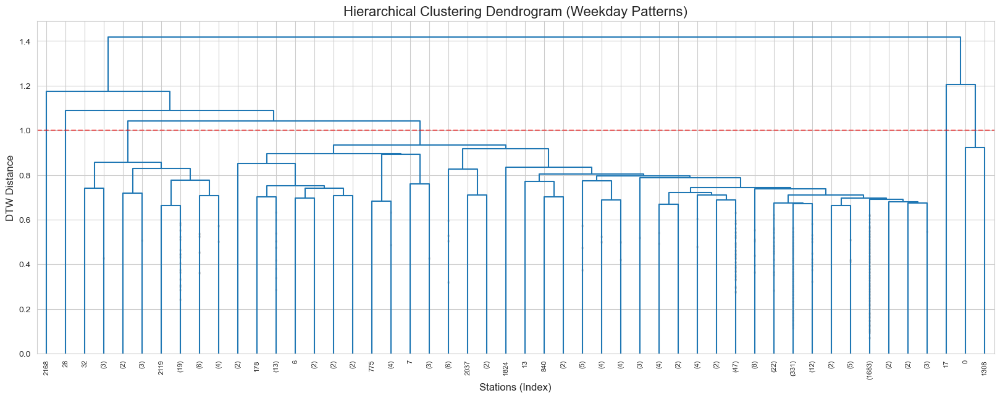

In [3]:
# Convert distance matrix to condensed form for hierarchical clustering
dist_condensed_weekday = squareform(dtw_matrix_weekday)

# Compute hierarchical clustering
Z_weekday = linkage(dist_condensed_weekday, method='average')

# Plot dendrogram
plt.figure(figsize=(20, 7))
plt.title('Hierarchical Clustering Dendrogram (Weekday Patterns)', fontsize=16)
plt.xlabel('Stations (Index)', fontsize=12)
plt.ylabel('DTW Distance', fontsize=12)

dendrogram(
    Z_weekday,
    leaf_rotation=90.,  
    leaf_font_size=8.,
    truncate_mode='lastp',
    p=50,
    show_contracted=True,
    color_threshold=0
)
plt.axhline(y=1, c='r', ls='--', alpha=0.5)
plt.show()

Based on the dendrogram, three potential cutting heights appear relevant for the study of station clustering:

1. **Cut at 1.15 (4 clusters):** This option provides a broad overview but is likely too general, potentially merging distinct station types that should remain separate.

2. **Cut at 0.85 (8 clusters):** On the contrary, this threshold creates too many clusters, leading to "artificial" divisions that generate more noise than meaningful information.
3. **Cut at 1.00 (6 clusters):** This represents an intermediate value. It identifies groups that are sufficiently distinct to be useful while remaining large enough to be generalizable. Consequently, **K = 6** is selected as the initial value for division.

In [4]:
# Number of clusters
K_weekday = 6

print(f"Cutting tree to obtain {K_weekday} clusters\n")

cluster_labels_weekday = fcluster(Z_weekday, t=K_weekday, criterion='maxclust')

df_signatures_weekday['cluster_label'] = cluster_labels_weekday

print("Distribution of stations per cluster:")
print(df_signatures_weekday['cluster_label'].value_counts().sort_index())

Cutting tree to obtain 6 clusters

Distribution of stations per cluster:
cluster_label
1      39
2    2191
3       1
4       1
5       2
6       1
Name: count, dtype: int64


After applying the cut at **K = 6**, several "isolated" stations appear, specifically in clusters 3, 4, 5, and 6. These represent extreme outliers—stations with behaviors significantly different from the norm, such as testing stations, stations that were closed during the period, or those with very low usage. Because they are mathematically distinct, the algorithm isolates them immediately. As a result, Cluster 2 becomes a "catch-all" group that masks internal differences among the majority of the stations.

This outcome is largely due to the `method: 'average'`, which is highly sensitive to outliers. To address this, the **Ward** method is implemented. Instead of looking purely at distances, Ward’s method minimizes the within-cluster variance, encouraging the formation of more spherical and size-balanced clusters.

The experiment is repeated below using the Ward method to compare the resulting dendrograms.

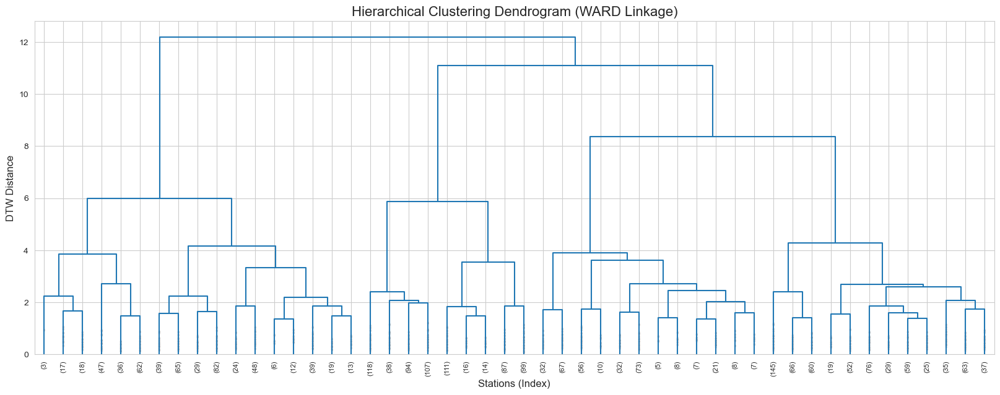

In [5]:
# Use 'ward' instead of 'average'
Z_weekday = linkage(dist_condensed_weekday, method='ward')

# Plot dendrogram
plt.figure(figsize=(20, 7))
plt.title('Hierarchical Clustering Dendrogram (WARD Linkage)', fontsize=16)
plt.xlabel('Stations (Index)', fontsize=12)
plt.ylabel('DTW Distance', fontsize=12)

dendrogram(
    Z_weekday,
    leaf_rotation=90.,  
    leaf_font_size=8.,
    truncate_mode='lastp',
    p=50,
    show_contracted=True,
    color_threshold=0
)
plt.show()

The improvement is immediately apparent. The differences between station groups are much more pronounced. The following cutting options are identified:

1. **Cut at 10 (3 clusters):** This is the most generalized division, revealing two highly distinct groups and a third more general cluster.
2. **Cut at 5 (6 clusters):** This is the limit before the clusters become overly specific. However, it serves as a good value for identifying highly specialized usage patterns.
3. **Cut at 7 (4 clusters):** This is the middle ground. It maintains the separation between the two large groups on the left and central branches while subdividing the right branch, which remains too general in the 3-cluster model.

Given that all three options show merit, each will be tested. The final selection will depend on the clarity provided by the subsequent visual analysis of the profiles.

In [6]:
# Remove previous cluster labels column
df_signatures_weekday.drop(columns=['cluster_label'], inplace=True)

# Create new cluster labels using 'ward' linkage
# Level 1: General (K = 3)
K_general = 3
df_signatures_weekday['cluster_macro'] = fcluster(Z_weekday, t=K_general, criterion='maxclust')

# Level 2: Balanced (K = 4)
K_balanced = 4
df_signatures_weekday['cluster_balanced'] = fcluster(Z_weekday, t=K_balanced, criterion='maxclust')

# Level 3: Especific (K = 6)
K_especific = 6
df_signatures_weekday['cluster_micro'] = fcluster(Z_weekday, t=K_especific, criterion='maxclust')

# Comparation of cluster distributions
print("Cluster distribution (General - K=3):")
print(df_signatures_weekday['cluster_macro'].value_counts().sort_index())

print("\nCluster distribution (Balanced - K=4):")
print(df_signatures_weekday['cluster_balanced'].value_counts().sort_index())

print("\nCluster distribution (Especific - K=6):")
print(df_signatures_weekday['cluster_micro'].value_counts().sort_index())

Cluster distribution (General - K=3):
cluster_macro
1    559
2    684
3    992
Name: count, dtype: int64

Cluster distribution (Balanced - K=4):
cluster_balanced
1    559
2    684
3    326
4    666
Name: count, dtype: int64

Cluster distribution (Especific - K=6):
cluster_micro
1    183
2    376
3    357
4    327
5    326
6    666
Name: count, dtype: int64


The algorithm now demonstrates a more effective distribution of stations, avoiding the issue where one cluster contains the vast majority of the data. Since all three configurations appear viable, the visual analysis of the "heartbeat" profiles will serve as the deciding factor for the final number of clusters.

### Cluster profiling

Now that we have assigned labels, let's visualize the "Heartbeat" of each cluster. We will plot:
1.  **The Centroid (Bold Line):** The average behavior of all stations in that cluster.
2.  **The Members (Faint Lines):** A sample of actual stations to see the variance.

In [7]:
def plot_cluster_profiles(df, n_clusters, cluster_name):
    # Get hours columns
    hour_cols = [c for c in df.columns if c.startswith('h_')]

    rows = (n_clusters // 2) + (n_clusters % 2)
    fig, axes = plt.subplots(rows, 2, figsize=(15, 4 * rows), sharex=False, sharey=True)
    axes = axes.flatten()

    palette = sns.color_palette("bright", n_clusters + 1)

    for k in range(1, n_clusters + 1):
        ax = axes[k-1]
        
        # Filter data for this cluster
        cluster_data = df[df[cluster_name] == k]
        
        # Plot a sample of individual stations
        sample = cluster_data.sample(min(100, len(cluster_data)), random_state=42)
        for _, row in sample.iterrows():
            ax.plot(range(24), row[hour_cols], color='gray', alpha=0.1, linewidth=0.5)
            
        # Plot the Centroid
        centroid = cluster_data[hour_cols].mean()
        ax.plot(range(24), centroid, color=palette[k-1], linewidth=3, label=f'Cluster {k}')
        
        ax.set_title(f'Cluster {k} ({len(cluster_data)} stations)', fontsize=14, fontweight='bold')
        ax.set_xticks(range(0, 24, 4))
        ax.grid(True, alpha=0.3)
        
    # Remove empty subplots if any
    for i in range(n_clusters, len(axes)):
        fig.delaxes(axes[i])
        
    plt.tight_layout(h_pad=2.0)
    plt.suptitle(f'Activity Profiles (K={n_clusters})', y=1.02, fontsize=18)
    plt.show()

In [8]:
CLUSTER_COLUMN_MACRO = 'cluster_macro'
NUM_CLUSTERS_MACRO = 3

CLUSTER_COLUMN_BALANCED = 'cluster_balanced'
NUM_CLUSTERS_BALANCED = 4

CLUSTER_COLUMN_MICRO = 'cluster_micro'
NUM_CLUSTERS_MICRO = 6

target_crs = "EPSG:4326"

# Load data to plot stations
df_stations = pd.read_csv('../data/processed/stations.csv')
nyc_map = gpd.read_file("../data/raw/city/Borough_Boundaries_20260126.geojson")
nyc_streets = gpd.read_file("../data/raw/city/Centerline_20260126.geojson")

df_stations['station_id'] = df_stations['station_id'].astype(str)

if df_signatures_weekday.index.name == 'station_id' or 'station_id' not in df_signatures_weekday.columns:
    df_signatures_weekday = df_signatures_weekday.reset_index()

df_signatures_weekday['start_station_id'] = df_signatures_weekday['start_station_id'].astype(str)

# Merge DataFrames
df_merged = df_stations.merge(
    df_signatures_weekday[['start_station_id', 'cluster_macro', 'cluster_balanced', 'cluster_micro']], 
    left_on='station_id', 
    right_on='start_station_id', 
    how='inner'
)

# Convert to GeoDataFrame
gdf_stations = gpd.GeoDataFrame(
    df_merged, 
    geometry=gpd.points_from_xy(df_merged['lng'], df_merged['lat']),
    crs=target_crs
)

if nyc_map.crs != target_crs: nyc_map = nyc_map.to_crs(target_crs)
if nyc_streets.crs != target_crs: nyc_streets = nyc_streets.to_crs(target_crs)
if gdf_stations.crs != target_crs: gdf_stations = gdf_stations.to_crs(target_crs)

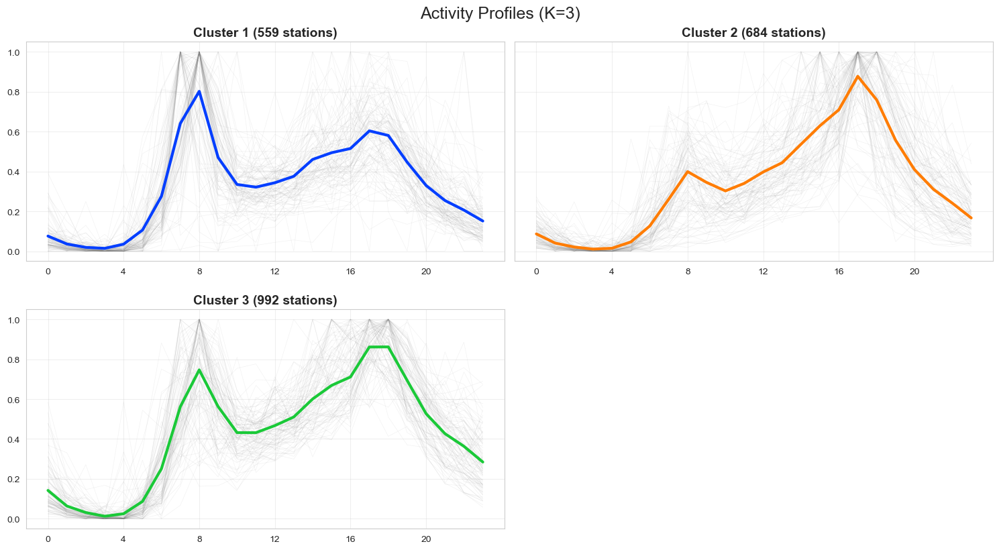

In [9]:
# Plot profiles for 3 clusters (General)
plot_cluster_profiles(df_signatures_weekday, 3, 'cluster_macro')

The 3-cluster division provides a solid initial insight into the city's dynamics.

**Cluster 1 (Residential):** Displays a sharp peak in departures at 8:00 AM, followed by relatively flat activity. This profile is characteristic of residential areas where users depart early to commute to work.

**Cluster 2 (Office/Workplace):** Shows a massive peak at 5:00 PM. This represents the "return home" phase, where users leave their workplaces or transit hubs to travel back to residential areas or other transportation nodes.

**Cluster 3 (Mixed/Leisure):** Displays peaks at both 8:00 AM and 5:00 PM, with sustained activity through 6:00 PM. This suggests a hybrid zone that combines residential use with leisure and evening social activities.

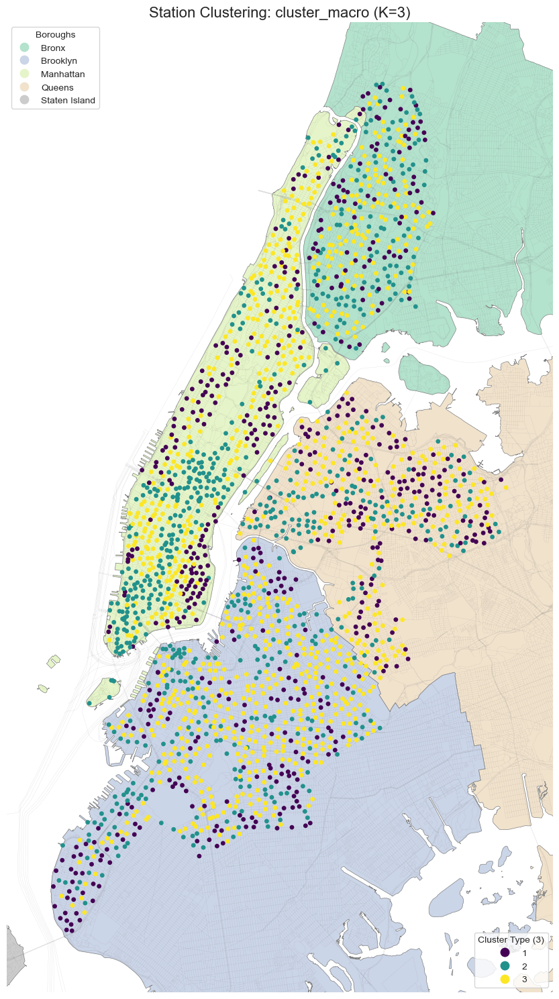

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))

nyc_map.plot(
    ax=ax, 
    column='boroname',
    cmap='Pastel2',
    edgecolor='gray',
    linewidth=0.5,
    legend=True,
    legend_kwds={'loc': 'upper left', 'title': 'Boroughs'}
)

# Save the legend object to reuse later
leg1 = ax.get_legend()

nyc_streets.plot(
    ax=ax, 
    color='gray', 
    linewidth=0.2, 
    alpha=0.3,
    zorder=1
)

gdf_stations.plot(
    ax=ax, 
    column=CLUSTER_COLUMN_MACRO,
    cmap='viridis',
    markersize=15,
    alpha=1,
    legend=True,
    categorical=True,
    zorder=2,
    legend_kwds={'loc': 'lower right', 'title': 'Cluster Type'}
)

# Re-add the first legend (Boroughs)
ax.add_artist(leg1)

plt.title(f'Station Clustering: {CLUSTER_COLUMN_MACRO} (K={NUM_CLUSTERS_MACRO})', fontsize=16)
plt.axis('off')

minx, miny, maxx, maxy = gdf_stations.total_bounds
margin = 0.02
ax.set_xlim(minx - margin, maxx + margin)
ax.set_ylim(miny - margin, maxy + margin)

plt.tight_layout()
plt.show()

The spatial analysis of the 3-cluster segmentation reveals the structure of New York’s mobility.

**Cluster 1 (Residential)** dominates the outer rings and peripheral neighborhoods of Manhattan, including the Upper West Side, Upper East Side, and large portions of Brooklyn and Queens. This confirms the logic of commuter mobility, where these areas act as net exporters of trips during the morning rush hour.

**Cluster 2 (Workplace)** defines the economic backbone of the city, forming a clear line from south of Central Park through Midtown to the Financial District. However, at $K=3$, a masking phenomenon occurs: this cluster also absorbs pure leisure zones. Areas such as Randalls Island, Governors Island, or DUMBO, which are primarily evening/weekend destinations, exhibit an afternoon arrival curve similar to office zones and miscategorized as workplaces.

**Cluster 3 (Mixed/High Density)** appears as a hybrid scattered throughout the city, with a notable concentration in neighborhoods like Chelsea. These areas combine high residential density with strong commercial and dining offerings, creating a constant bidirectional flow that the model distinguishes from purely residential or labor-focused functions.

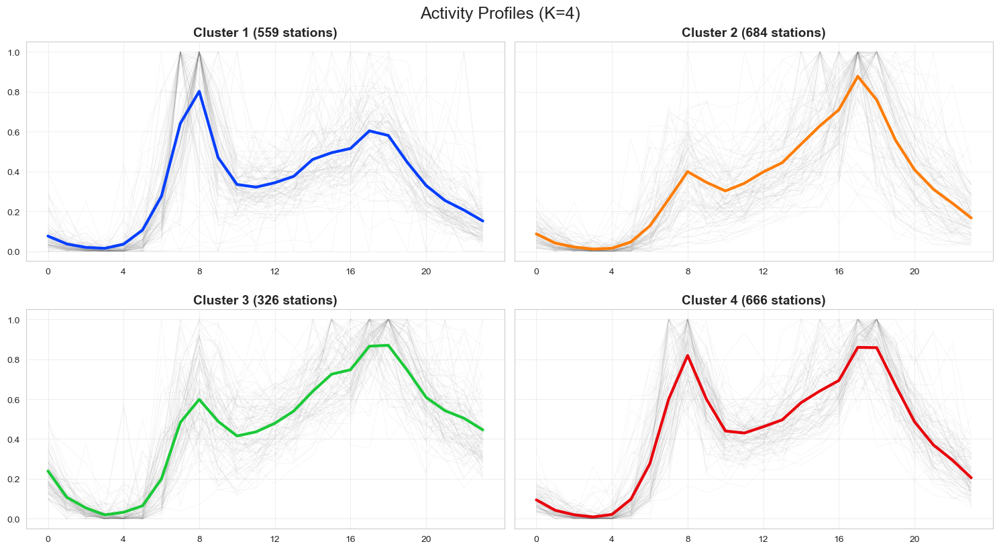

In [10]:
# Plot profiles for 4 clusters (Balanced)
plot_cluster_profiles(df_signatures_weekday, 4, 'cluster_balanced')

The 4-cluster division mirrors the previous logic but introduces critical nuances by subdividing the "Mixed" group into two distinct functional typologies.

**Cluster 1 (Residential)** & **Cluster 2 (Workplace)**: These remain consistent, representing the primary commuter flows.

**Cluster 4:** This group presents a nearly perfect bimodal curve, with massive peaks at both 08:00 AM and 5:00 PM.

**Cluster 3:** Unlike Cluster 4, this group shows a more relaxed morning profile and increasing activity that peaks in the late afternoon and evening.

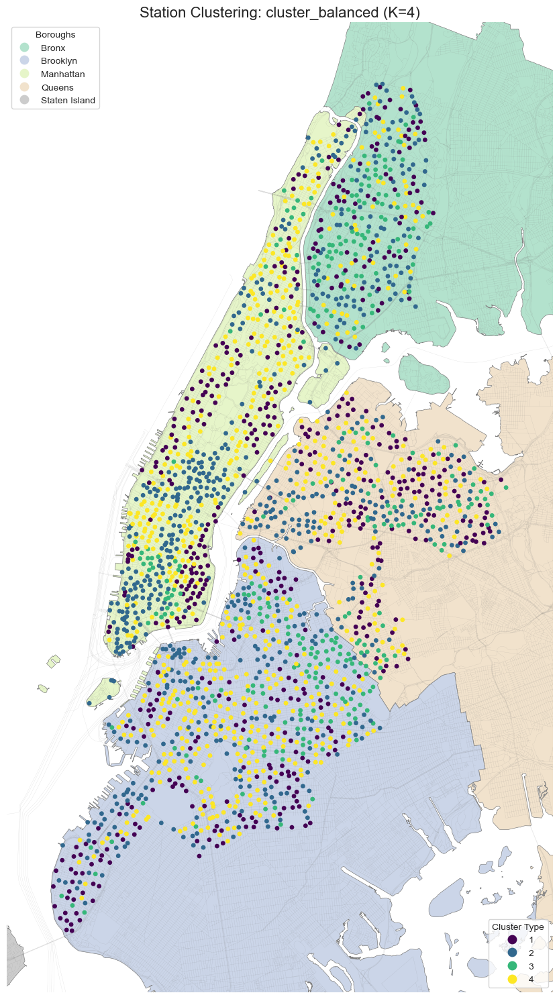

In [16]:
fig, ax = plt.subplots(figsize=(15, 15))

nyc_map.plot(
    ax=ax, 
    column='boroname',
    cmap='Pastel2',
    edgecolor='gray',
    linewidth=0.5,
    legend=True,
    legend_kwds={'loc': 'upper left', 'title': 'Boroughs'}
)

# Save the legend object to reuse later
leg1 = ax.get_legend()

nyc_streets.plot(
    ax=ax, 
    color='gray', 
    linewidth=0.2, 
    alpha=0.3,
    zorder=1
)

gdf_stations.plot(
    ax=ax, 
    column=CLUSTER_COLUMN_BALANCED,
    cmap='viridis',
    markersize=15,
    alpha=1,
    legend=True,
    categorical=True,
    zorder=2,
    legend_kwds={'loc': 'lower right', 'title': 'Cluster Type'}
)

# Re-add the first legend (Boroughs)
ax.add_artist(leg1)

plt.title(f'Station Clustering: {CLUSTER_COLUMN_BALANCED} (K={NUM_CLUSTERS_BALANCED})', fontsize=16)
plt.axis('off')

minx, miny, maxx, maxy = gdf_stations.total_bounds
margin = 0.02
ax.set_xlim(minx - margin, maxx + margin)
ax.set_ylim(miny - margin, maxy + margin)

plt.tight_layout()
plt.show()

Comparing the 4-cluster map to the 3-cluster version confirms that the Residential (**Cluster 1**) and Workplace (**Cluster 2**) categories are exceptionally stable. Their activity is so distinct that they remain separated regardless of the increase in granularity.

The primary refinement occurs in the division of the former "Mixed" branch into Clusters 3 and 4. Both represent zones with residential and commercial characteristics (showing both morning and evening peaks). However, **Cluster 4 (High Intensity / Hubs)** exhibits a much higher morning intensity, indicating a higher population density or a stronger role as a transit node. This is reflected in Manhattan’s taller residential buildings and major transit corridors.

In contrast, **Cluster 3 (Neighborhood Life / Leisure)** is prevalent in the neighborhoods surrounding Manhattan. These areas have similar behavior but lower morning volume, suggesting that the primary differentiator between these two clusters is population density and the intensity of the morning "outflow."

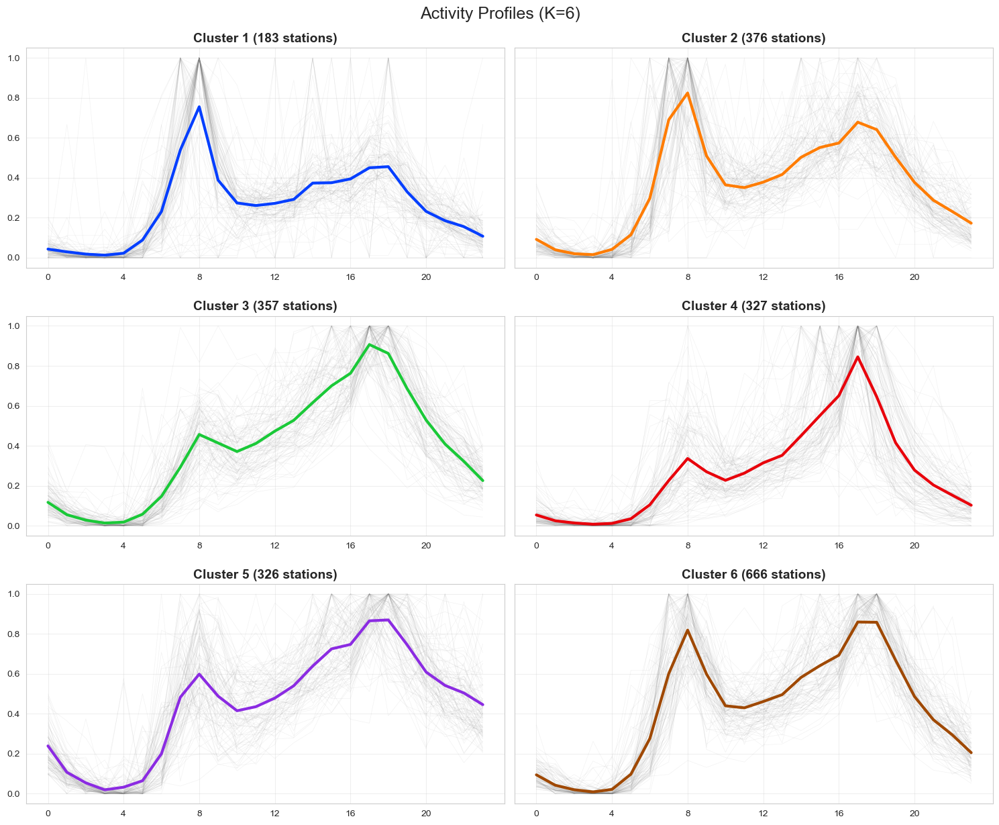

In [11]:
# Plot profiles for 6 clusters (Especific)
plot_cluster_profiles(df_signatures_weekday, 6, 'cluster_micro')

Finally, the 6-cluster model is evaluated. At this level of granularity, the zones become highly fragmented, making it difficult to define station types without constant reference to the map.

**Cluster 1 & 4:** Represent high-density residential and workplace zones, respectively, with very specialized peaks.

**Cluster 2 (Peripheral Residential):** Shows a peak starting as early as 7:00 AM. This likely represents commuters in the outer boroughs who require more travel time to reach the city center.

**Clusters 3 & 5:** Similar profiles indicating mixed-use zones with high residential presence but significant afternoon/evening employment or commercial activity.

**Cluster 6:** Appears to be a high-density residential zone situated near major leisure landmarks.

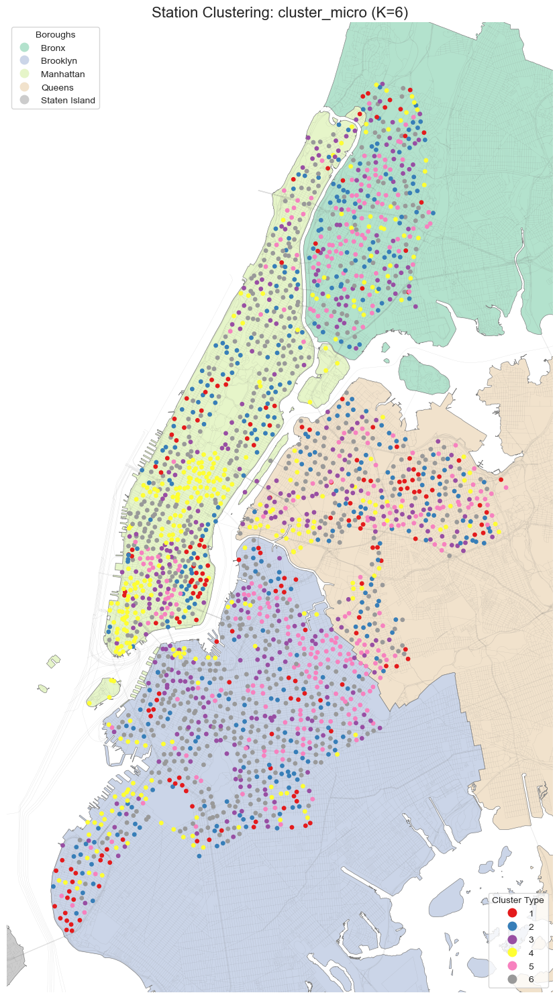

In [9]:
fig, ax = plt.subplots(figsize=(15, 15))

nyc_map.plot(
    ax=ax, 
    column='boroname',
    cmap='Pastel2',
    edgecolor='gray',
    linewidth=0.5,
    legend=True,
    legend_kwds={'loc': 'upper left', 'title': 'Boroughs'}
)

# Save the legend object to reuse later
leg1 = ax.get_legend()

nyc_streets.plot(
    ax=ax, 
    color='gray', 
    linewidth=0.2, 
    alpha=0.3,
    zorder=1
)

gdf_stations.plot(
    ax=ax, 
    column=CLUSTER_COLUMN_MICRO,
    cmap='Set1',
    markersize=15,
    alpha=1,
    legend=True,
    categorical=True,
    zorder=2,
    legend_kwds={'loc': 'lower right', 'title': 'Cluster Type'}
)

# Re-add the first legend (Boroughs)
ax.add_artist(leg1)

plt.title(f'Station Clustering: {CLUSTER_COLUMN_MICRO} (K={NUM_CLUSTERS_MICRO})', fontsize=16)
plt.axis('off')

minx, miny, maxx, maxy = gdf_stations.total_bounds
margin = 0.02
ax.set_xlim(minx - margin, maxx + margin)
ax.set_ylim(miny - margin, maxy + margin)

plt.tight_layout()
plt.show()

The 6-cluster analysis further refines the initial groupings. Notably, the original Residential and Workplace clusters are each split into two.

- **Cluster 1:** Purely residential stations (Upper West Side, Upper East Side, parts of Brooklyn/Queens) with intense morning activity and minimal afternoon usage.

- **Cluster 4:** Pure destination stations (Midtown and Financial District) where usage peaks exclusively at the end of the workday.

- **Cluster 2:** Residential but with a small 6:00 PM uptick, indicating proximity to leisure or minor workplace hubs (e.g., stations around Central Park).

- **Cluster 3:** Lacks a morning peak and maintains high activity from midday through the night, corresponding to leisure-heavy areas like Little Italy, Chinatown, and Williamsburg.

- **Cluster 5:** A mixed-use profile (Commercial-Residential-Nightlife) with a notable peak at midnight, capturing users returning from late-night social activities.

- **Cluster 6:** Functions as a "high-intensity node" with identical morning and afternoon peaks, typical of multimodal transport intersections.

### Final conclusion

After evaluating segmentations for 3, 4, and 6 clusters, it is determined that K=4 offers the optimal balance between operational precision and strategic clarity.

The 3-cluster model is overly generalized, merging office dynamics with leisure activity. Conversely, the 6-cluster model introduces excessive granularity that fragments homogeneous zones without adding significant value. The 4-cluster model successfully isolates the critical "Mixed" dynamics, separating High-Intensity Hubs (bidirectional traffic on major avenues) from Neighborhood Leisure (social activity in the East Village/Williamsburg). This distinction is vital for urban planning, as it differentiates mandatory commuting from discretionary leisure mobility.

## Weekend analysis

The study is repeated for weekend data to observe how infrastructure usage shifts when commuting patterns disappear. As before, a dendrogram using the Ward method is used to determine the ideal number of clusters.

### Dendrogram

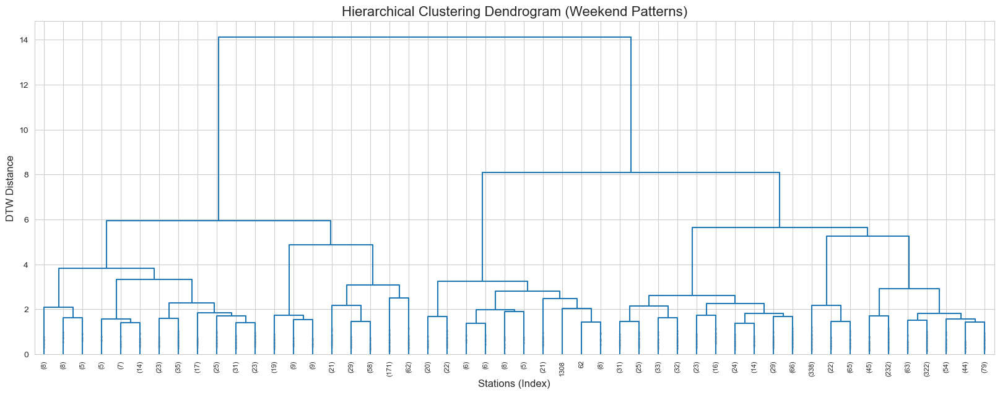

In [12]:
dist_condensed_weekend = squareform(dtw_matrix_weekend)

# Compute hierarchical clustering
Z_weekend = linkage(dist_condensed_weekend, method='ward')

# Plot dendrogram
plt.figure(figsize=(20, 7))
plt.title('Hierarchical Clustering Dendrogram (Weekend Patterns)', fontsize=16)
plt.xlabel('Stations (Index)', fontsize=12)
plt.ylabel('DTW Distance', fontsize=12)

dendrogram(
    Z_weekend,
    leaf_rotation=90.,  
    leaf_font_size=8.,
    truncate_mode='lastp',
    p=50,
    show_contracted=True,
    color_threshold=0
)
plt.show()

The dendrogram reveals two primary branches (left and right). Each can be further subdivided before the model loses generalizability. To find the most meaningful separation, the following experiments are proposed:

1. **K = 2:** A high-level division to identify the two most fundamental usage patterns.
2. **K = 3:** Subdividing the right branch to highlight minor variations within that group.
3. **K = 4:** Subdividing the left branch to complete the separation of station typologies.

In [13]:
# Create new cluster labels using 'ward' linkage
# Level 1: General (K = 2)
K_general = 2
df_signatures_weekend['cluster_macro'] = fcluster(Z_weekend, t=K_general, criterion='maxclust')

# Level 2: Balanced (K = 3)
K_balanced = 3
df_signatures_weekend['cluster_balanced'] = fcluster(Z_weekend, t=K_balanced, criterion='maxclust')

# Level 3: Especific (K = 4)
K_especific =4
df_signatures_weekend['cluster_micro'] = fcluster(Z_weekend, t=K_especific, criterion='maxclust')

# Comparation of cluster distributions
print("Cluster distribution (General - K=2):")
print(df_signatures_weekend['cluster_macro'].value_counts().sort_index())

print("\nCluster distribution (Balanced - K=3):")
print(df_signatures_weekend['cluster_balanced'].value_counts().sort_index())

print("\nCluster distribution (Especific - K=4):")
print(df_signatures_weekend['cluster_micro'].value_counts().sort_index())

Cluster distribution (General - K=2):
cluster_macro
1     579
2    1655
Name: count, dtype: int64

Cluster distribution (Balanced - K=3):
cluster_balanced
1     579
2      98
3    1557
Name: count, dtype: int64

Cluster distribution (Especific - K=4):
cluster_micro
1     201
2     378
3      98
4    1557
Name: count, dtype: int64


The distribution of stations within each cluster provides initial insights. At $K=2$, one group is significantly more populous than the other. When moving to $K=3$, the newly created cluster from the right branch is very small, suggesting it represents a niche group of stations. However, at $K=4$, the left branch splits into two groups of similar size, suggesting a more balanced and meaningful distinction. A visual analysis follows to confirm the optimal K.

In [14]:
CLUSTER_COLUMN_MACRO = 'cluster_macro'
NUM_CLUSTERS_MACRO = 2

CLUSTER_COLUMN_BALANCED = 'cluster_balanced'
NUM_CLUSTERS_BALANCED = 3

CLUSTER_COLUMN_MICRO = 'cluster_micro'
NUM_CLUSTERS_MICRO = 4

target_crs = "EPSG:4326"

if df_signatures_weekend.index.name == 'station_id' or 'station_id' not in df_signatures_weekend.columns:
    df_signatures_weekend = df_signatures_weekend.reset_index()

df_signatures_weekend['start_station_id'] = df_signatures_weekend['start_station_id'].astype(str)

# Merge DataFrames
df_merged = df_stations.merge(
    df_signatures_weekend[['start_station_id', 'cluster_macro', 'cluster_balanced', 'cluster_micro']], 
    left_on='station_id', 
    right_on='start_station_id', 
    how='inner'
)

# Convert to GeoDataFrame
gdf_stations = gpd.GeoDataFrame(
    df_merged, 
    geometry=gpd.points_from_xy(df_merged['lng'], df_merged['lat']),
    crs=target_crs
)

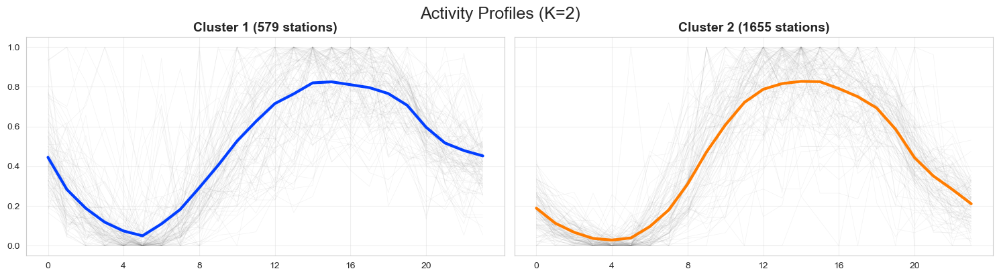

In [15]:
# Plot profiles for 2 clusters (General)
plot_cluster_profiles(df_signatures_weekend, 2, 'cluster_macro')

At $K=2$, the clusters appear very similar at first glance. The primary difference is that **Cluster 1** shows higher activity during the early morning hours (midnight to 4:00 AM), suggesting these stations are located in nightlife districts.

A major shift from weekday behavior is observed: there are no morning "rush hour" peaks. Instead, usage increases steadily toward midday, indicating a purely recreational and commercial use of the service.

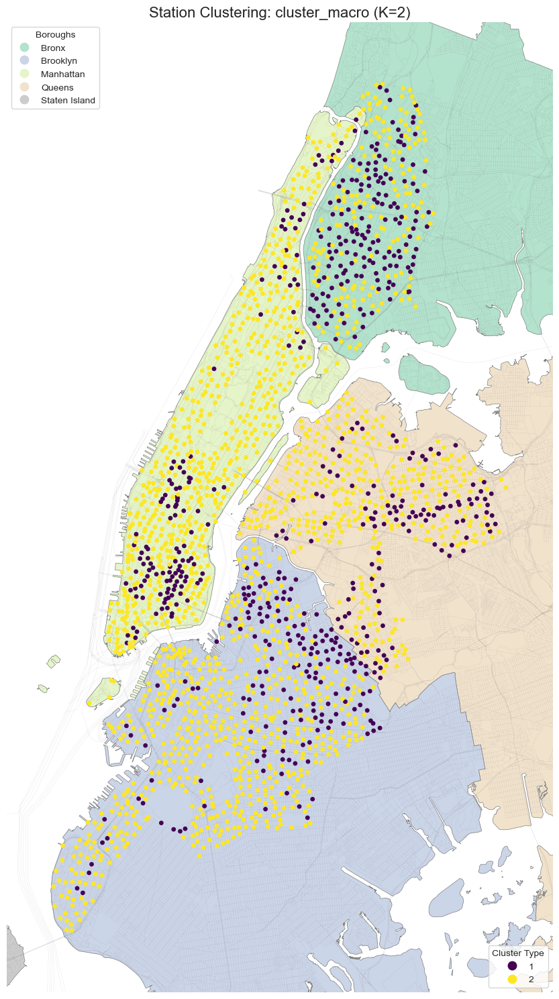

In [17]:
fig, ax = plt.subplots(figsize=(15, 15))

nyc_map.plot(
    ax=ax, 
    column='boroname',
    cmap='Pastel2',
    edgecolor='gray',
    linewidth=0.5,
    legend=True,
    legend_kwds={'loc': 'upper left', 'title': 'Boroughs'}
)

# Save the legend object to reuse later
leg1 = ax.get_legend()

nyc_streets.plot(
    ax=ax, 
    color='gray', 
    linewidth=0.2, 
    alpha=0.3,
    zorder=1
)

gdf_stations.plot(
    ax=ax, 
    column=CLUSTER_COLUMN_MACRO,
    cmap='viridis',
    markersize=15,
    alpha=1,
    legend=True,
    categorical=True,
    zorder=2,
    legend_kwds={'loc': 'lower right', 'title': 'Cluster Type'}
)

# Re-add the first legend (Boroughs)
ax.add_artist(leg1)

plt.title(f'Station Clustering: {CLUSTER_COLUMN_MACRO} (K={NUM_CLUSTERS_MACRO})', fontsize=16)
plt.axis('off')

minx, miny, maxx, maxy = gdf_stations.total_bounds
margin = 0.02
ax.set_xlim(minx - margin, maxx + margin)
ax.set_ylim(miny - margin, maxy + margin)

plt.tight_layout()
plt.show()

The binary segmentation offers a fundamental distinction based on activity duration:

**Cluster 1 (Extended Activity / Peripheral):** Includes stations where usage does not drop drastically during the night. Geographically, this is found in The Bronx and the outer rings of Brooklyn, where usage is more local and constant, but it also captures nightlife hubs like Bushwick in Brooklyn.

**Cluster 2 (Standard Diurnal):** Cover the majority of the system. Its curve follows a perfect bell shape concentrated during daylight and commercial hours, dominating Manhattan (SoHo, Tribeca) and Downtown Brooklyn.

While this separates "day" from "night/extended" use, it remains too broad. Grouping low-intensity Bronx stations with high-intensity nightlife zones masks important functional differences.

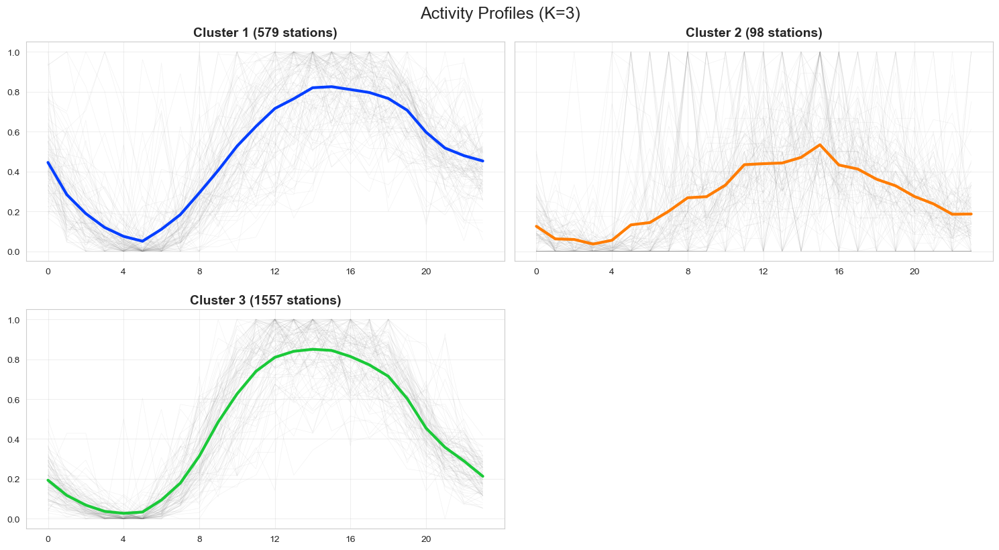

In [16]:
# Plot profiles for 3 clusters (Balanced)
plot_cluster_profiles(df_signatures_weekend, 3, 'cluster_balanced')

The 3-cluster segmentation reveals that the former Cluster 2 has been split to isolate stations with minimal weekend usage. This results in Cluster 2 (low usage) and Cluster 3, which now shows even higher peak activity than before.

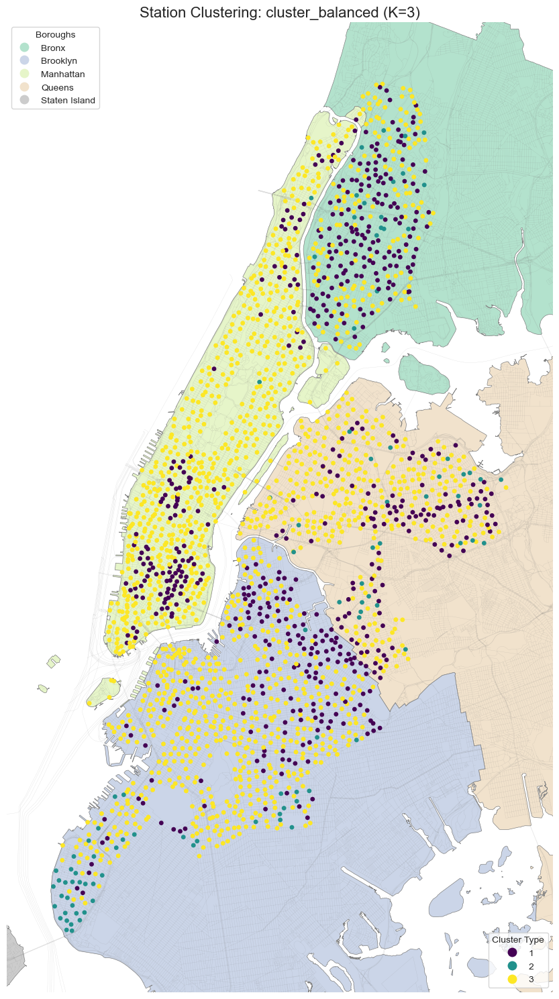

In [19]:
fig, ax = plt.subplots(figsize=(15, 15))

nyc_map.plot(
    ax=ax, 
    column='boroname',
    cmap='Pastel2',
    edgecolor='gray',
    linewidth=0.5,
    legend=True,
    legend_kwds={'loc': 'upper left', 'title': 'Boroughs'}
)

# Save the legend object to reuse later
leg1 = ax.get_legend()

nyc_streets.plot(
    ax=ax, 
    color='gray', 
    linewidth=0.2, 
    alpha=0.3,
    zorder=1
)

gdf_stations.plot(
    ax=ax, 
    column=CLUSTER_COLUMN_BALANCED,
    cmap='viridis',
    markersize=15,
    alpha=1,
    legend=True,
    categorical=True,
    zorder=2,
    legend_kwds={'loc': 'lower right', 'title': 'Cluster Type'}
)

# Re-add the first legend (Boroughs)
ax.add_artist(leg1)

plt.title(f'Station Clustering: {CLUSTER_COLUMN_BALANCED} (K={NUM_CLUSTERS_BALANCED})', fontsize=16)
plt.axis('off')

minx, miny, maxx, maxy = gdf_stations.total_bounds
margin = 0.02
ax.set_xlim(minx - margin, maxx + margin)
ax.set_ylim(miny - margin, maxy + margin)

plt.tight_layout()
plt.show()

This segmentation reveals a concentric structure in weekend bike usage:

**Cluster 3 (Urban Core / Active Leisure):** Dominates Manhattan and trendy Brooklyn neighborhoods. This cluster has the most pronounced activity curve, reflecting the high intensity of tourist and commercial use in the city center.

**Cluster 1 (Peripheral Residential):** Includes The Bronx and outer Queens/Brooklyn. While the shape mirrors the urban core (peaking at midday), the intensity is lower, representing local neighborhood life rather than tourist flows.

**Cluster 2 (Low Demand):** A small, scattered group with irregular and low usage curves, representing areas where the bike-share service has not significantly penetrated as a weekend leisure option.

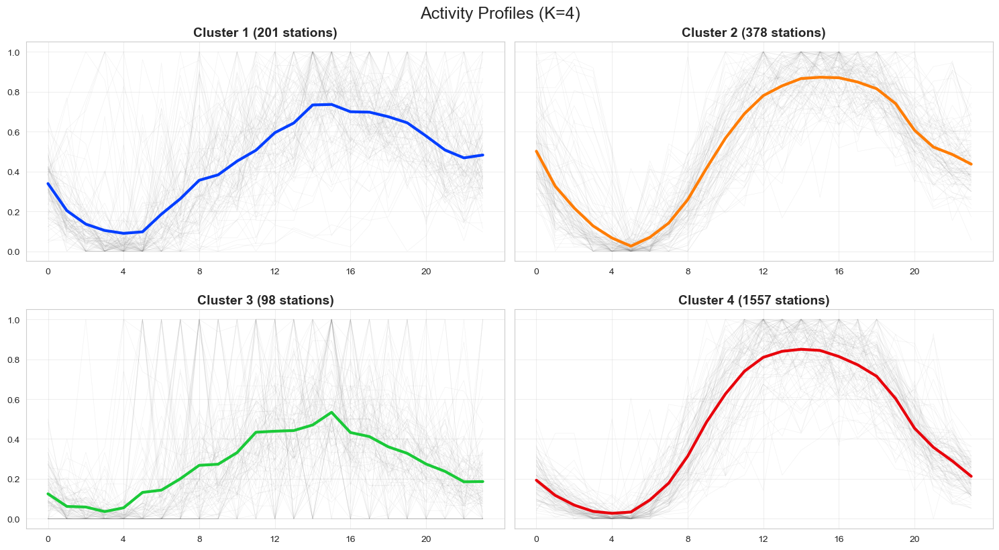

In [17]:
# Plot profiles for 4 clusters (Micro)
plot_cluster_profiles(df_signatures_weekend, 4, 'cluster_micro')

The 4-cluster division creates a new group (Cluster 1) that resembles Cluster 3 in shape but with lower volume. While activity is lower than in the urban core, these stations still record a significant number of trips. Interestingly, Cluster 1 shows more activity in the very early morning (6:00 AM–8:00 AM) compared to Cluster 2. Geographic mapping is required to classify these stations accurately.

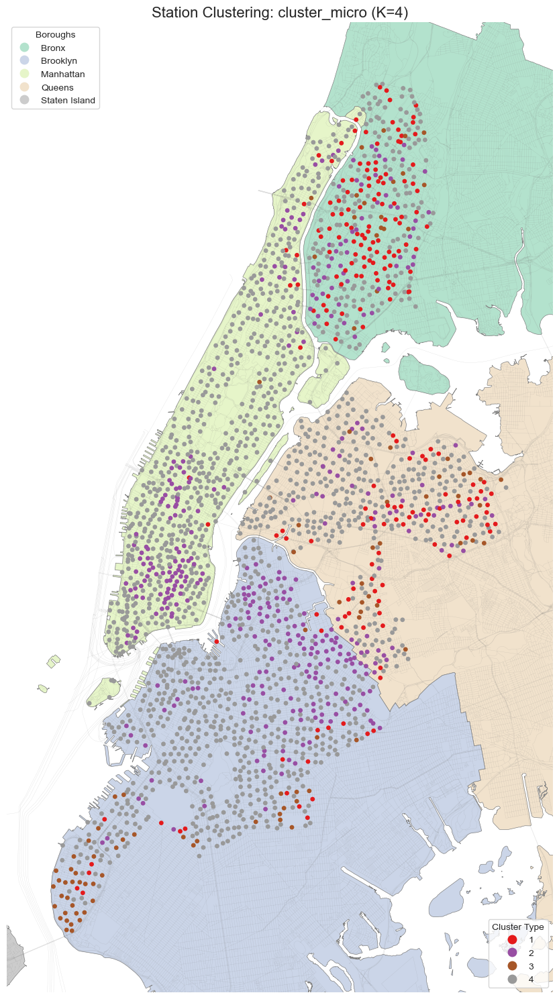

In [23]:
fig, ax = plt.subplots(figsize=(15, 15))

nyc_map.plot(
    ax=ax, 
    column='boroname',
    cmap='Pastel2',
    edgecolor='gray',
    linewidth=0.5,
    legend=True,
    legend_kwds={'loc': 'upper left', 'title': 'Boroughs'}
)

# Save the legend object to reuse later
leg1 = ax.get_legend()

nyc_streets.plot(
    ax=ax, 
    color='gray', 
    linewidth=0.2, 
    alpha=0.3,
    zorder=1
)

gdf_stations.plot(
    ax=ax, 
    column=CLUSTER_COLUMN_MICRO,
    cmap='Set1',
    markersize=15,
    alpha=1,
    legend=True,
    categorical=True,
    zorder=2,
    legend_kwds={'loc': 'lower right', 'title': 'Cluster Type'}
)

# Re-add the first legend (Boroughs)
ax.add_artist(leg1)

plt.title(f'Station Clustering: {CLUSTER_COLUMN_MICRO} (K={NUM_CLUSTERS_MICRO})', fontsize=16)
plt.axis('off')

minx, miny, maxx, maxy = gdf_stations.total_bounds
margin = 0.02
ax.set_xlim(minx - margin, maxx + margin)
ax.set_ylim(miny - margin, maxy + margin)

plt.tight_layout()
plt.show()

The visual analysis concludes that during the weekend, the city synchronizes its rhythm: labor schedules vanish, and activity is governed by sunlight. The primary differences lie in intensity and location.

**Cluster 4 (Standard Residential Use):** The most common type (gray), covering residential Brooklyn, Queens, and Upper Manhattan. It represents local errands and social visits.

**Cluster 2 (Commercial and Tourist Leisure):** Concentrated in Midtown, SoHo, and trendy Brooklyn. It features an "explosive" midday curve that remains high into the evening, reflecting shopping and tourist attractions.

**Cluster 1 (Peripheral / Local Recreational):** Primarily in The Bronx and outer Brooklyn. The curve is unique, showing a "plateau" rather than a sharp peak, suggesting long-duration usage and internal neighborhood mobility.

**Cluster 3 (Low Intensity):** Stations with negligible or irregular demand.

### Final conclusion

The 4-cluster division is the optimal solution for weekend analysis. It balances generalization with operational detail by successfully separating **Standard Residential** use from the high-intensity **Commercial/Tourist** core. Crucially, it isolates the **Peripheral** (Bronx) behavior, characterized by its unique plateau demand, from the statistical noise of **Low-Intensity** stations. This granularity is essential for understanding mobility at the system's edges, preventing functional zones from being dismissed as simply "low usage."